In [249]:
import pandas as pd
import geopandas as gpd
import sys
import os
import numpy as np
import matplotlib.pyplot as plt

In [250]:
sys.path.append(r'/mnt/data/GEOSAN/FUNCTIONS/GIRAPH-functions/')
try:
    import db_utils as db
    import esda_utils as esda
    import map_utils as map
except FileNotFoundError:
    print("Wrong file or file path")
project_dir: str = r"/mnt/data/GEOSAN/RESEARCH PROJECTS/SYNDEMIC @ LASIG (EPFL)/GEOSAN-syndemic/"

## Import data

In [251]:
# CoLaus
colaus = gpd.read_file(os.sep.join(
    [project_dir, "processed_data/prev_reli_colaus_outcomes.gpkg"]), driver='GPKG')

In [252]:
# COVID
covid = gpd.read_file(os.sep.join(
    [project_dir, "processed_data/incidence_reli_covid_waves.gpkg"]), driver='GPKG')

In [253]:
covid.dtypes

reli            float64
n_test          float64
n_pos           float64
m_vr            float64
m_age           float64
logincid        float64
n_test_w1       float64
n_pos_w1        float64
m_vr_w1         float64
m_age_w1        float64
logincid_w1     float64
n_test_w2       float64
n_pos_w2        float64
m_vr_w2         float64
m_age_w2        float64
logincid_w2     float64
n_test_w3       float64
n_pos_w3        float64
m_vr_w3         float64
m_age_w3        float64
logincid_w3     float64
n_test_w4       float64
n_pos_w4        float64
m_vr_w4         float64
m_age_w4        float64
logincid_w4     float64
n_test_w5       float64
n_pos_w5        float64
m_vr_w5         float64
m_age_w5        float64
logincid_w5     float64
geometry       geometry
dtype: object

In [255]:
# Background map (municipalities)
engine, conn, cursor = db.connect_db('geosan', 'aladoy')
sql = ("SELECT * "
       "FROM lausanne_region_mun ")
mun = gpd.read_postgis(sql, conn, geom_col='geometry')

Sucessfully connected to GEOSAN DB


/home/aladoy/anaconda3/envs/syndemic/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


In [95]:
import importlib
importlib.reload(esda)

<module 'esda_utils' from '/mnt/data/GEOSAN/FUNCTIONS/GIRAPH-functions/esda_utils.py'>

## Spatial weights

Define a quartic kernel with 8 neighbors.

In [256]:
# Compute weights for colaus
w8k_colaus = esda.compute_distance_weights(colaus, 'Kernel', ids='reli', kernel_args=dict(function='quartic', k=8, fixed=False, eps=1.1))

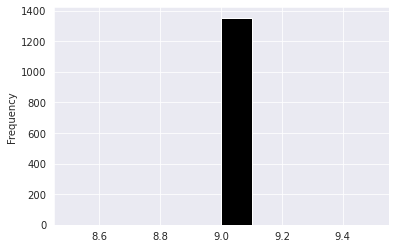

In [257]:
# Histogram of cardinalities
pd.Series(w8k_colaus.cardinalities).plot.hist(color="k");

As specified in the definition of the spatial weighting scheme, all observations have 8 neighbors. Hence they have 9 cardinalities each as the central location is also included.

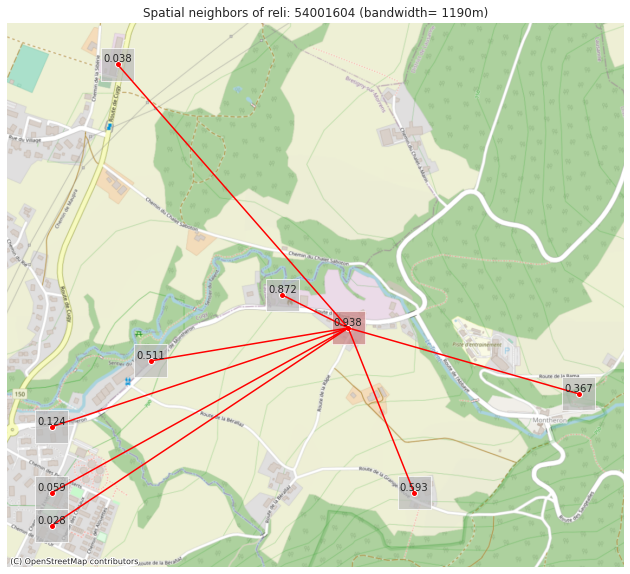

In [258]:
# Show spatial weights representation in a rural context
reli_campagne = 54001604
esda.map_spatial_neighbors(colaus, w8k_colaus, 'reli', reli_campagne)

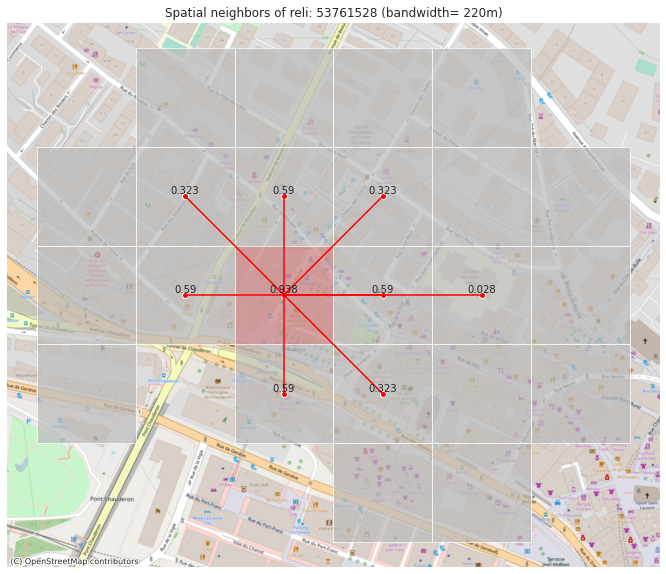

In [259]:
# Show spatial weights representation in an urban context
reli_urbain = 53761528
esda.map_spatial_neighbors(colaus, w8k_colaus, 'reli', reli_urbain)

/home/aladoy/anaconda3/envs/syndemic/lib/python3.10/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


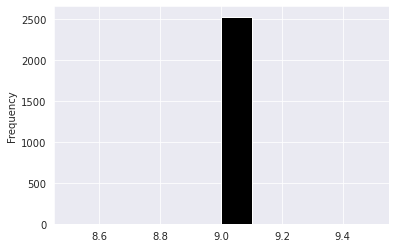

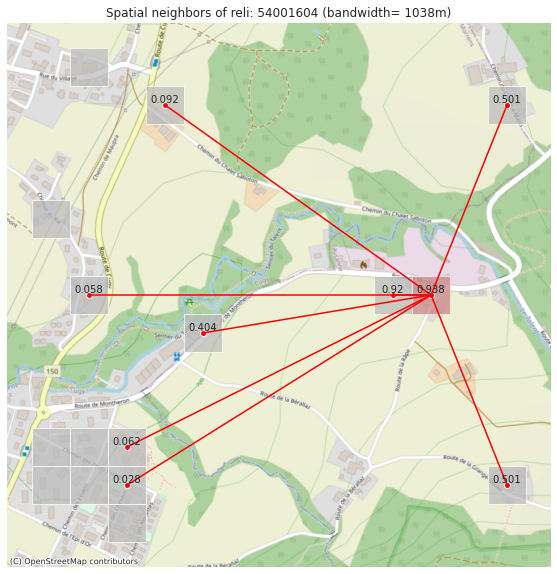

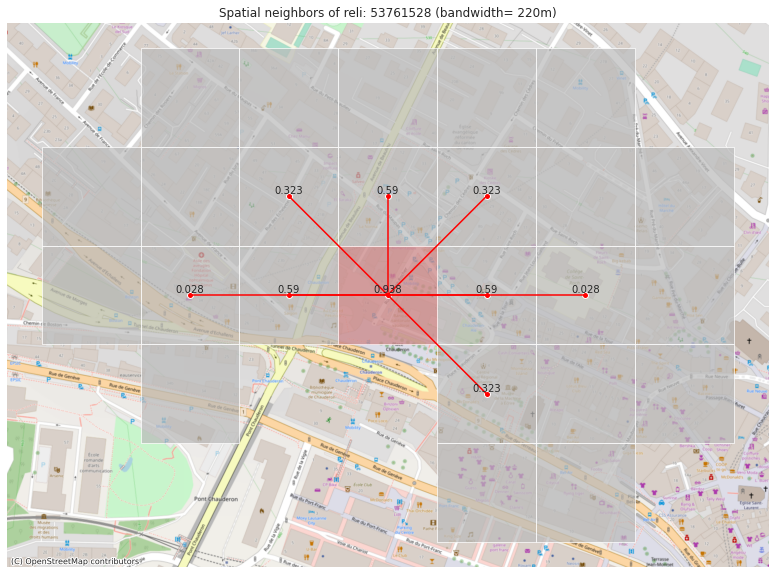

In [260]:
# Compute weights for colaus
w8k_covid = esda.compute_distance_weights(covid, 'Kernel', ids='reli', kernel_args=dict(function='quartic', k=8, fixed=False, eps=1.1))
# Histogram of cardinalities
pd.Series(w8k_covid.cardinalities).plot.hist(color="k")
esda.map_spatial_neighbors(covid, w8k_covid, 'reli', reli_campagne)
esda.map_spatial_neighbors(covid, w8k_covid, 'reli', reli_urbain)

## Spatial autocorrelation

In [261]:
def explore_spatial_autocorr(gdf, var, w, local_args=None):
    I = esda.global_moran(gdf[var], w)

    LMo, p = esda.local_moran(gdf, var, w, **local_args, seed=29)

    fig, ax = plt.subplots(figsize=(15, 10))
    esda.map_lisa(ax, LMo, p, alpha=0.8)
    map.add_basemap(ax, 2056, provider='Esri.WorldGrayCanvas')

    return LMo

#### CoLaus outcomes

In [159]:
colaus.dtypes

reli                 float64
n                      int64
cvd_ev_logit         float64
cvd_hist_logit       float64
cvd_all_logit        float64
ht_t_logit           float64
ht_m_logit           float64
hc_t_logit           float64
diab_t_logit         float64
diab_m_logit         float64
overweight_logit     float64
obesity_logit        float64
polypharm_logit      float64
geometry            geometry
dtype: object

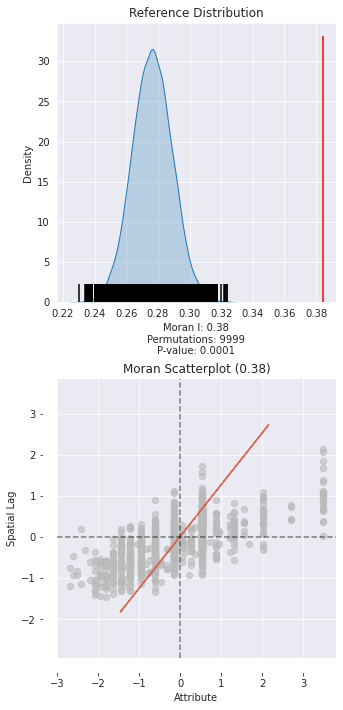

p-value threshold:  0.05
lisa_labels
HH                   69
HL                   45
LH                   24
LL                  125
Not significant    1090
dtype: int64


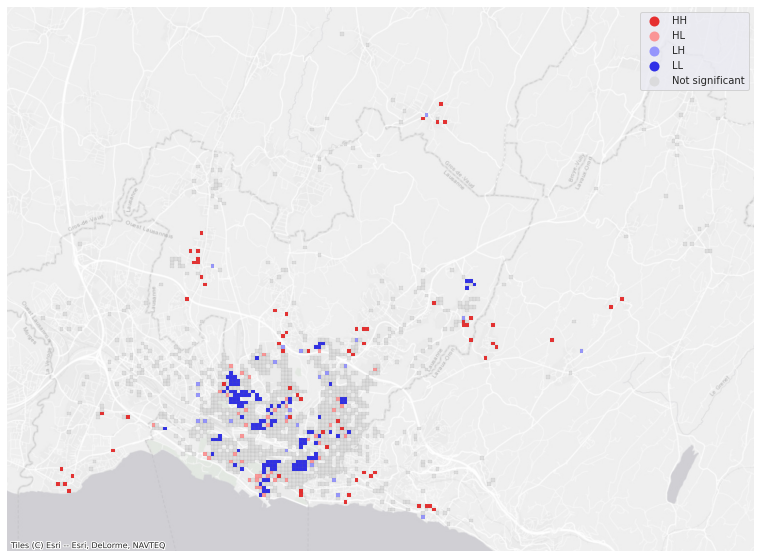

In [57]:
# CVD 
explore_spatial_autocorr(colaus, 'cvd_all_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

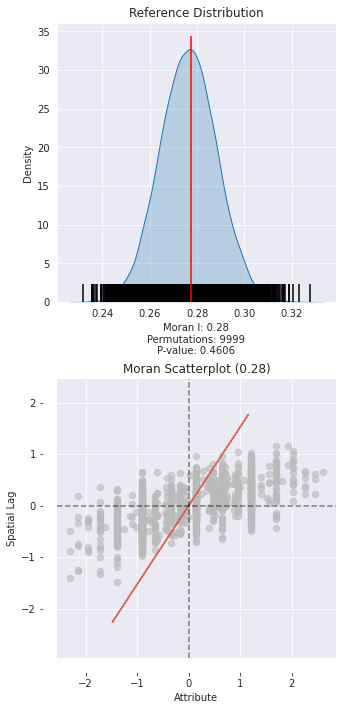

p-value threshold:  0.05
lisa_labels
HH                   37
HL                   35
LH                   28
LL                   40
Not significant    1213
dtype: int64


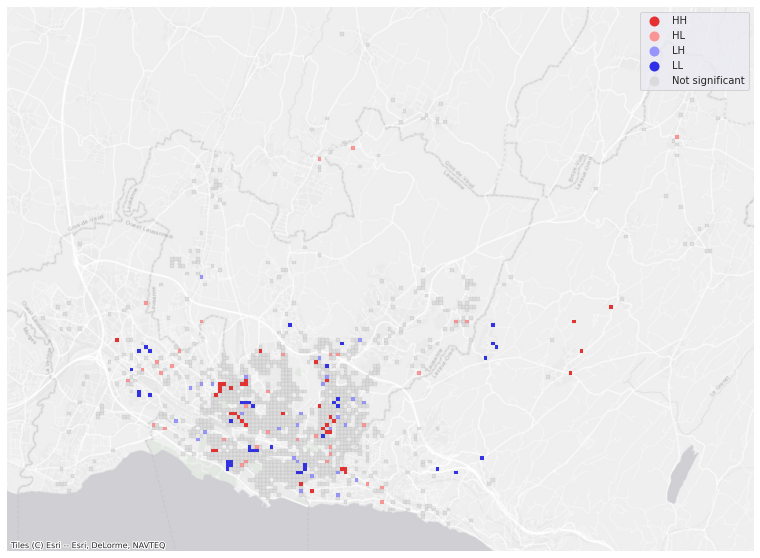

In [160]:
# Hypertension (measured) 
explore_spatial_autocorr(colaus, 'ht_m_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

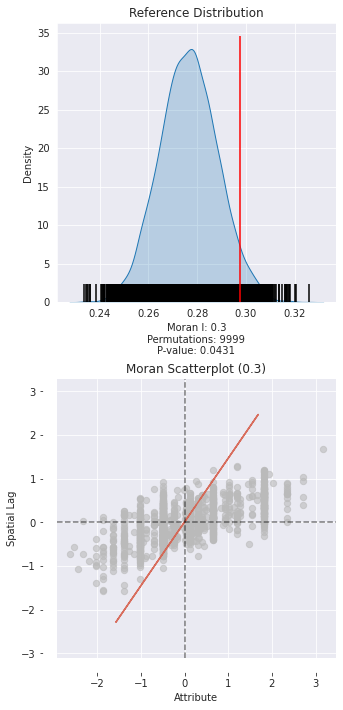

p-value threshold:  0.05
lisa_labels
HH                   27
HL                   25
LH                   42
LL                   54
Not significant    1205
dtype: int64


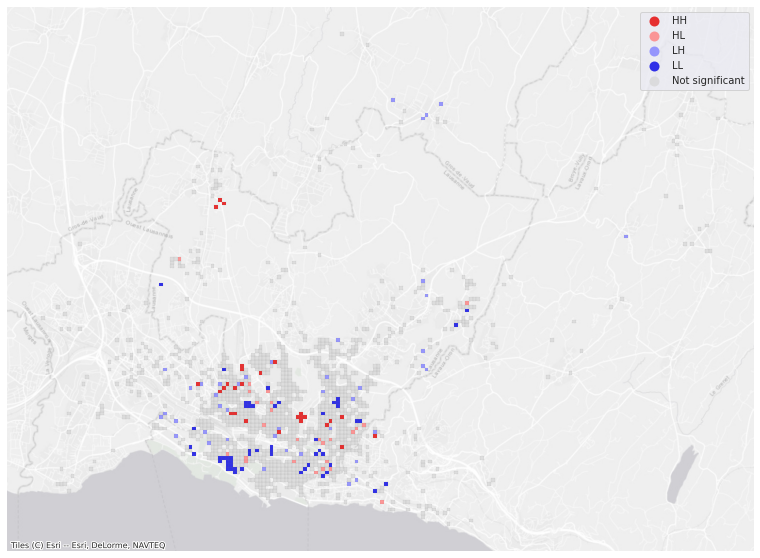

In [58]:
# Hypertension (told) 
explore_spatial_autocorr(colaus, 'ht_t_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

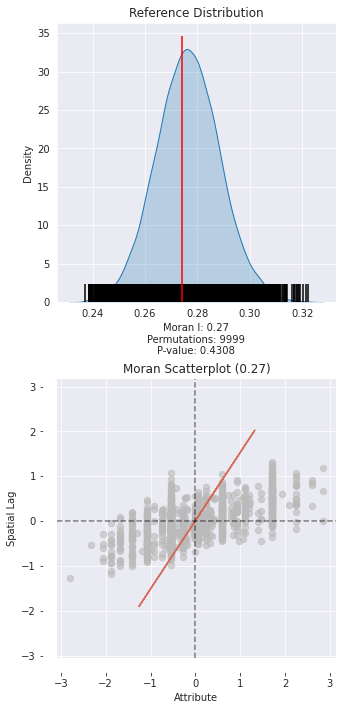

p-value threshold:  0.05
lisa_labels
HH                   33
HL                   27
LH                   36
LL                   37
Not significant    1220
dtype: int64


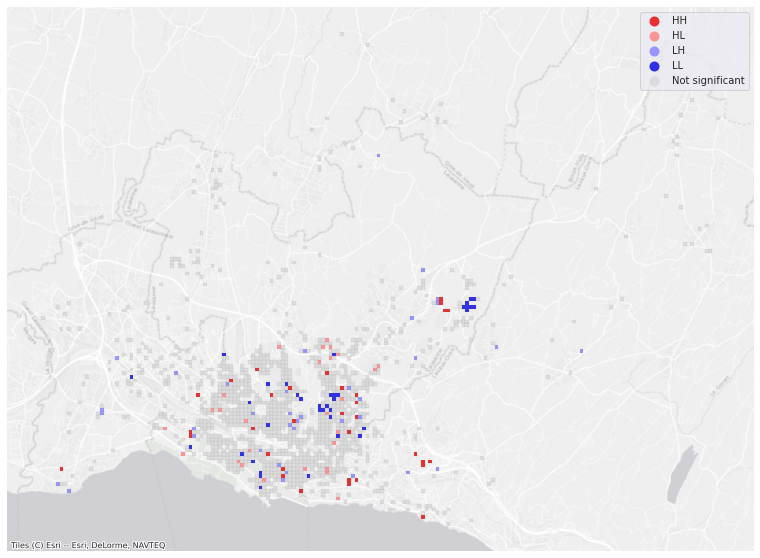

In [60]:
# Cholesterol (told) 
explore_spatial_autocorr(colaus, 'hc_t_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

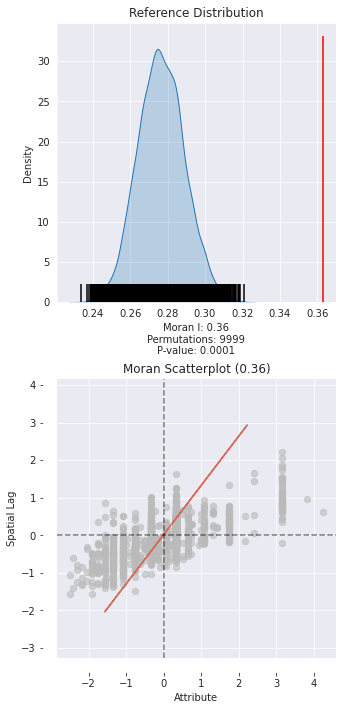

p-value threshold:  0.05
lisa_labels
HH                   53
HL                   56
LH                   29
LL                  100
Not significant    1115
dtype: int64


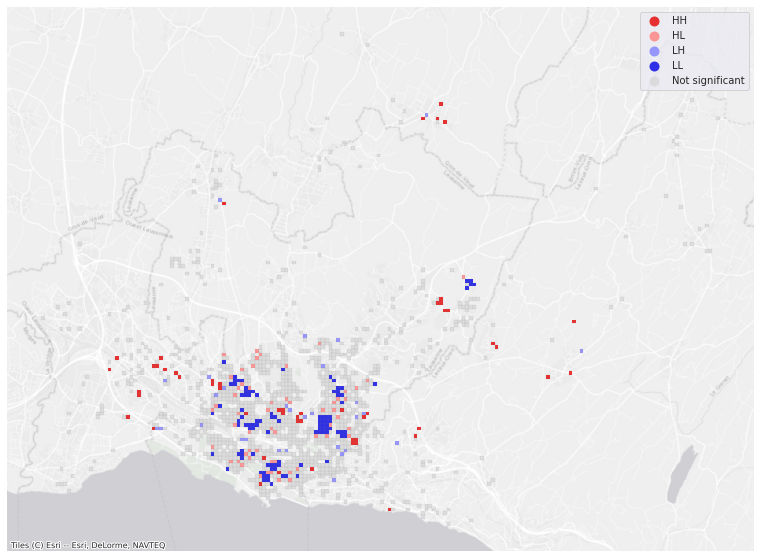

In [61]:
# Diabetes (told) 
explore_spatial_autocorr(colaus, 'diab_t_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

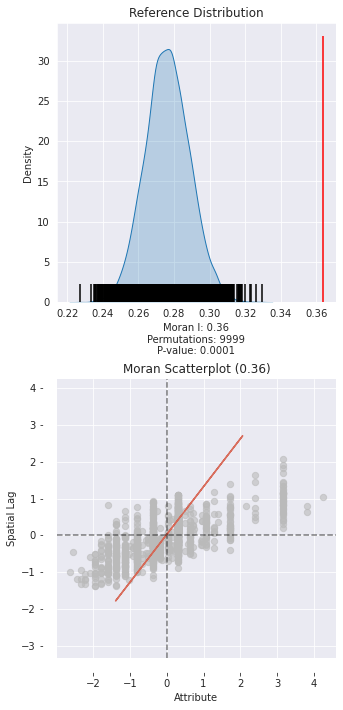

p-value threshold:  0.05
lisa_labels
HH                   84
HL                   51
LH                   30
LL                  108
Not significant    1080
dtype: int64


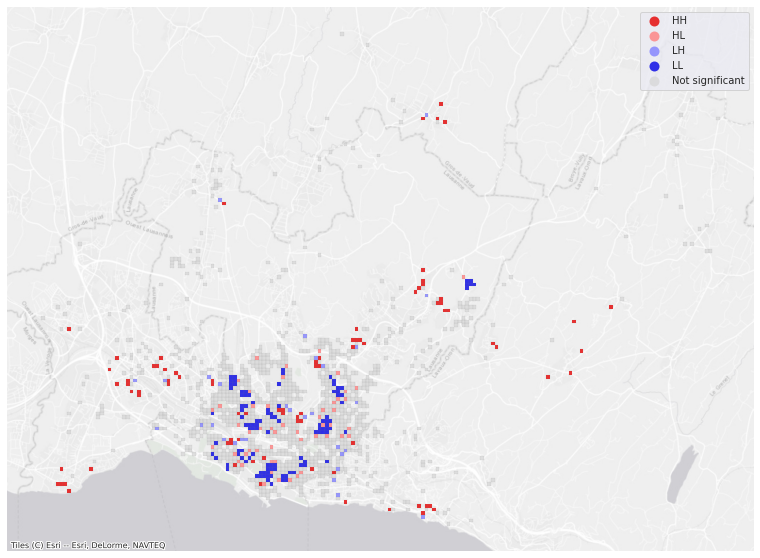

In [63]:
# Diabetes (measured) 
explore_spatial_autocorr(colaus, 'diab_m_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

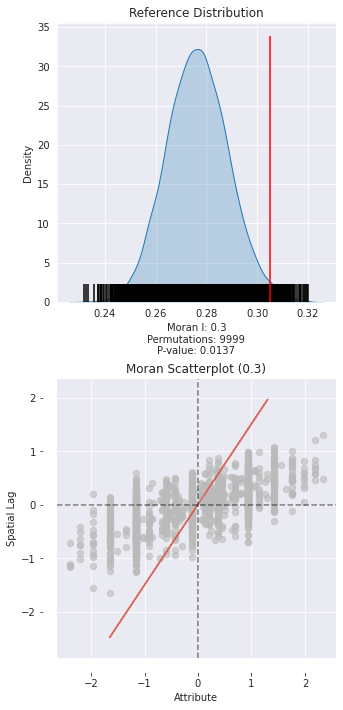

p-value threshold:  0.05
lisa_labels
HH                   37
HL                   30
LH                   31
LL                   51
Not significant    1204
dtype: int64


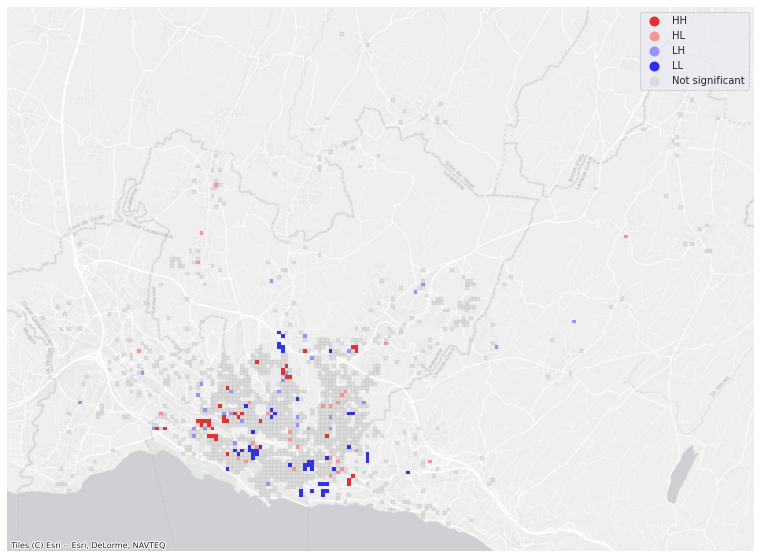

In [55]:
# Overweight
explore_spatial_autocorr(colaus, 'overweight_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

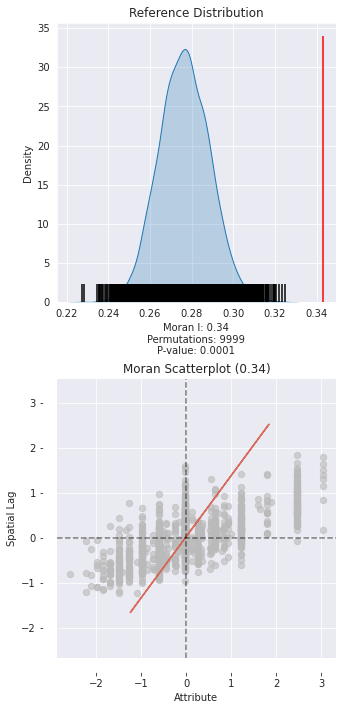

p-value threshold:  0.05
lisa_labels
HH                   26
HL                   33
LH                   60
LL                   88
Not significant    1146
dtype: int64


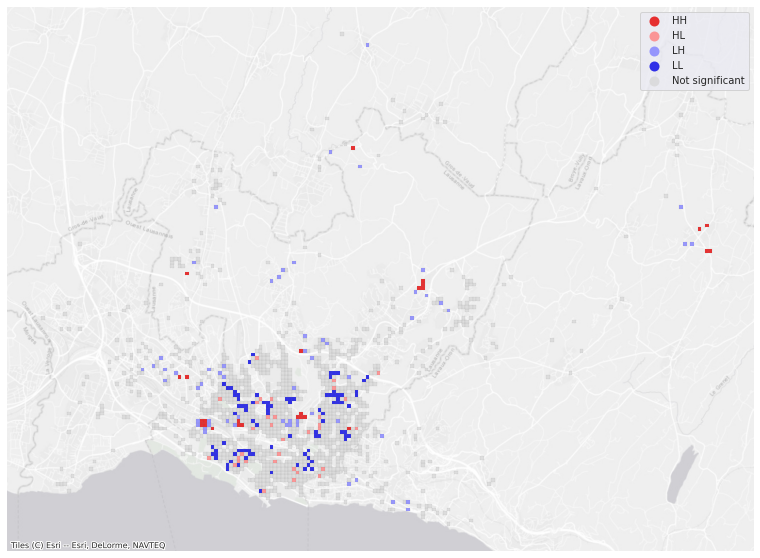

In [54]:
# Obesity
explore_spatial_autocorr(colaus, 'obesity_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

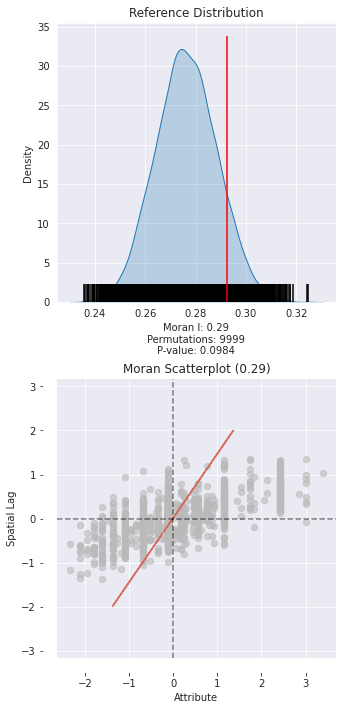

p-value threshold:  0.05
lisa_labels
HH                   24
HL                   29
LH                   50
LL                   62
Not significant    1188
dtype: int64


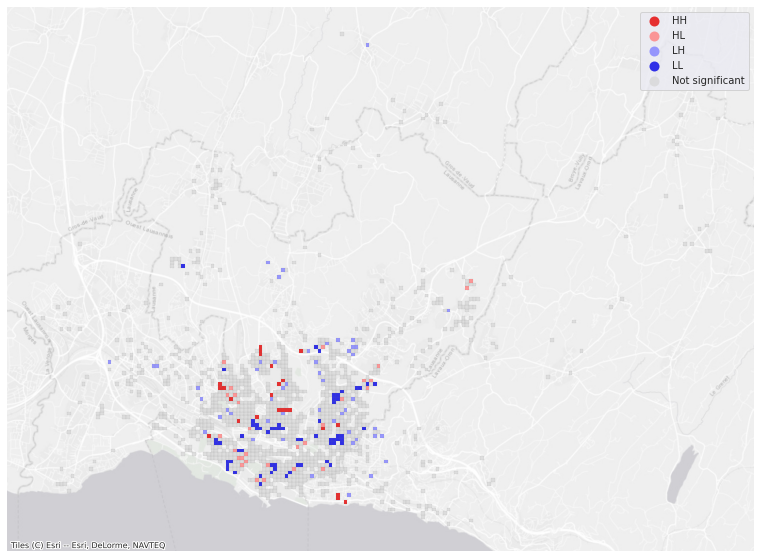

In [64]:
# Polypharm
explore_spatial_autocorr(colaus, 'polypharm_logit', w8k_colaus, local_args=dict(alpha=0.05, fdr_adj=False))

### COVID-19

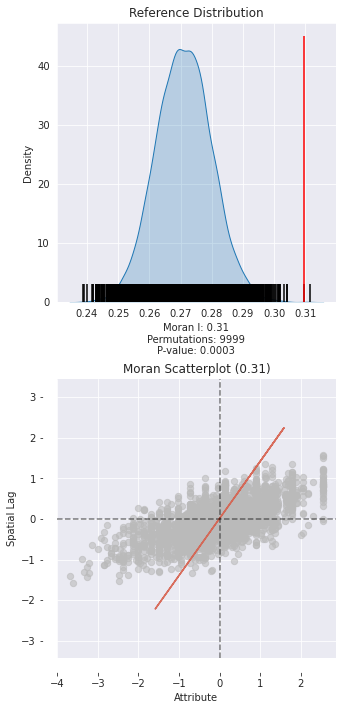

p-value threshold:  0.05
lisa_labels
HH                   98
HL                   74
LH                   63
LL                  102
Not significant    2193
dtype: int64


,reli,n_test,n_pos,m_vr,m_age,logincid,n_test_w1,n_pos_w1,m_vr_w1,m_age_w1,...,n_pos_w5,m_vr_w5,m_age_w5,logincid_w5,geometry,Is,quads,p_sim,lisa_cluster,lisa_labels
0,53111516.0,4.0,1.0,1.764463e+09,55.000000,-1.098612,3.0,1.0,1.764463e+09,57.666667,...,0.0,NaN,47.000000,-1.098612,"POLYGON ((2531100.000 1151600.000, 2531100.000...",0.399698,1.0,0.2668,0.0,Not significant
1,53131515.0,3.0,0.0,NaN,65.000000,-1.945910,1.0,0.0,NaN,46.000000,...,0.0,NaN,74.500000,-1.609438,"POLYGON ((2531300.000 1151500.000, 2531300.000...",-0.165054,3.0,0.0473,3.0,LH
2,53131518.0,1.0,0.0,NaN,71.000000,-1.098612,1.0,0.0,NaN,71.000000,...,NaN,NaN,NaN,NaN,"POLYGON ((2531300.000 1151800.000, 2531300.000...",0.323291,1.0,0.3669,0.0,Not significant
3,53151558.0,10.0,3.0,5.766969e+08,59.500000,-1.098612,2.0,0.0,NaN,58.500000,...,1.0,5.810689e+07,56.666667,-0.847298,"POLYGON ((2531500.000 1155800.000, 2531500.000...",-0.236455,4.0,0.0793,0.0,Not significant
4,53151559.0,7.0,1.0,9.572598e+06,54.714286,-1.609438,3.0,1.0,9.572598e+06,52.666667,...,NaN,NaN,NaN,NaN,"POLYGON ((2531500.000 1155900.000, 2531500.000...",-0.002305,4.0,0.4169,0.0,Not significant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2525,55021583.0,2.0,0.0,NaN,75.500000,-1.609438,1.0,0.0,NaN,65.000000,...,NaN,NaN,NaN,NaN,"POLYGON ((2550200.000 1158300.000, 2550200.000...",-0.041762,4.0,0.1438,0.0,Not significant
2526,55021585.0,6.0,0.0,NaN,69.666667,-2.564949,1.0,0.0,NaN,57.000000,...,0.0,NaN,91.500000,-1.609438,"POLYGON ((2550200.000 1158500.000, 2550200.000...",0.182524,2.0,0.4211,0.0,Not significant
2527,55021587.0,10.0,4.0,1.063486e+09,67.200000,-0.847298,3.0,2.0,1.934522e+09,64.666667,...,1.0,3.825215e+08,92.000000,0.000000,"POLYGON ((2550200.000 1158700.000, 2550200.000...",-0.148192,4.0,0.1362,0.0,Not significant
2528,55021593.0,1.0,0.0,NaN,47.000000,-1.098612,1.0,0.0,NaN,47.000000,...,NaN,NaN,NaN,NaN,"POLYGON ((2550200.000 1159300.000, 2550200.000...",0.575808,1.0,0.1123,0.0,Not significant


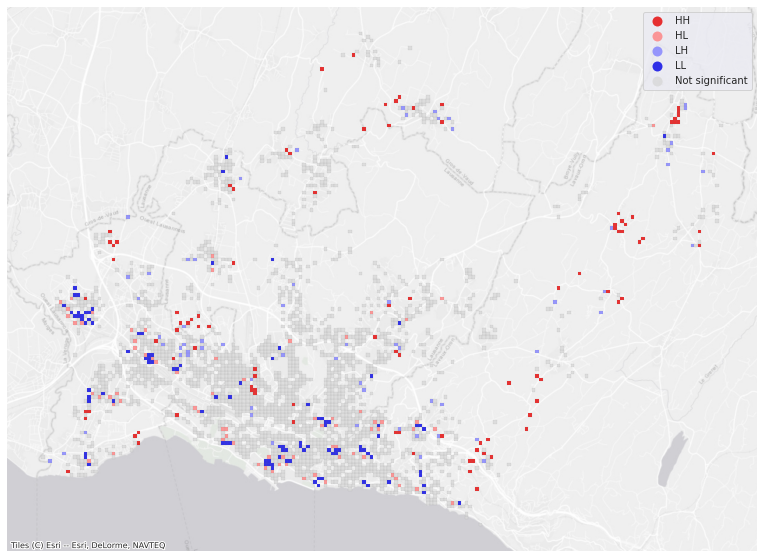

In [262]:
# Covid All
explore_spatial_autocorr(covid, 'logincid', w8k_covid, local_args=dict(alpha=0.05, fdr_adj=False))

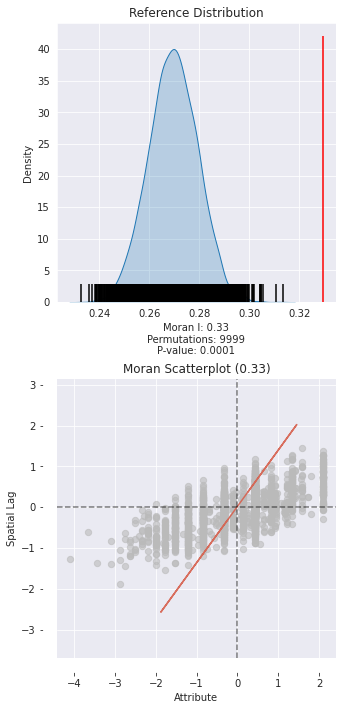

p-value threshold:  0.05
lisa_labels
HH                  102
HL                   91
LH                   26
LL                   89
Not significant    1771
dtype: int64


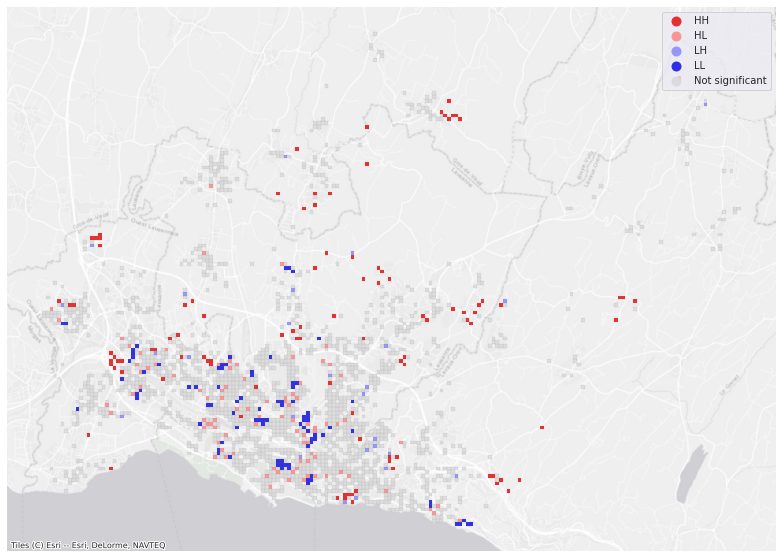

In [195]:
# Covid W1
explore_spatial_autocorr(covid, 'logincid_w1', w8k_covid, local_args=dict(alpha=0.05, fdr_adj=False))

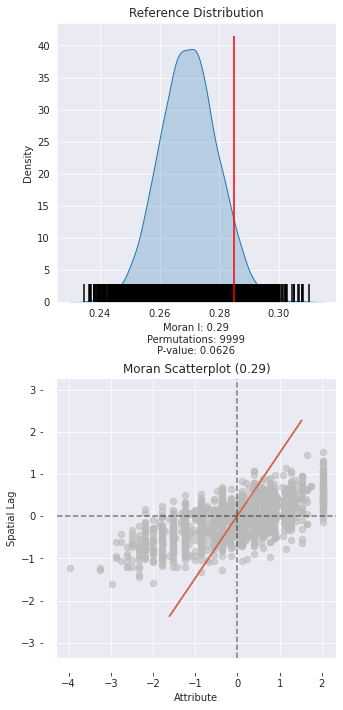

p-value threshold:  0.05
lisa_labels
HH                   58
HL                   60
LH                   38
LL                   61
Not significant    1862
dtype: int64


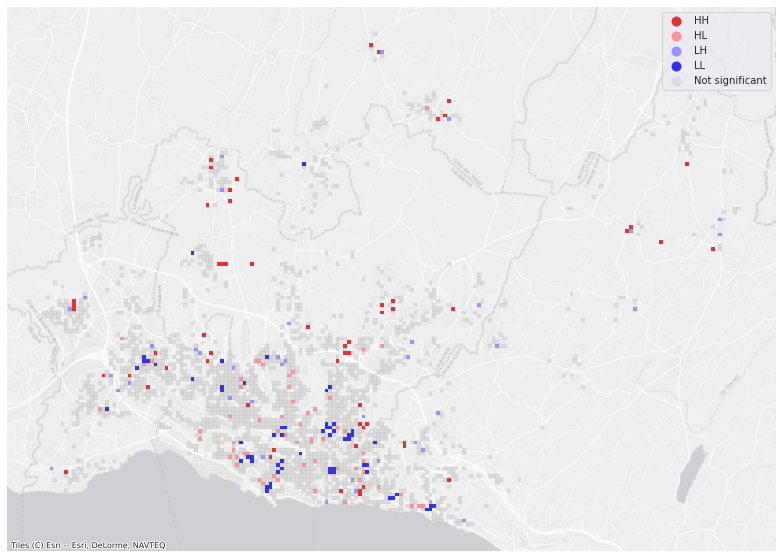

In [196]:
# Covid W2
explore_spatial_autocorr(covid, 'logincid_w2', w8k_covid, local_args=dict(alpha=0.05, fdr_adj=False))

/home/aladoy/anaconda3/envs/syndemic/lib/python3.10/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


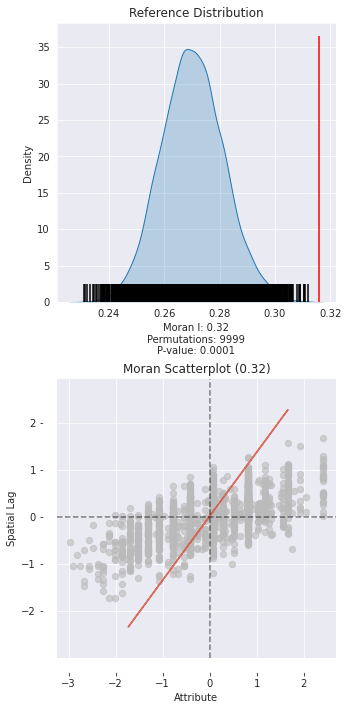

p-value threshold:  0.05
lisa_labels
HH                   67
HL                   58
LH                   32
LL                   72
Not significant    1423
dtype: int64


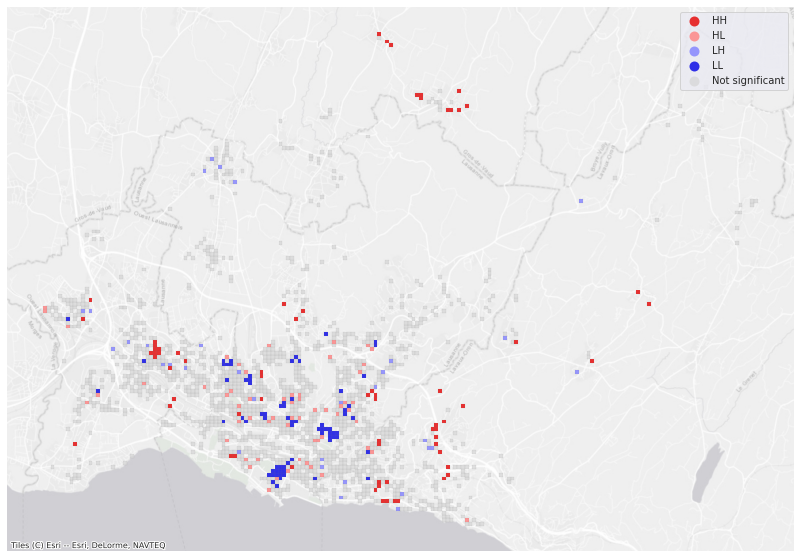

In [197]:
covid_w3 = covid[~covid.logincid_w3.isna()].reset_index(drop=True)
w8k_covid_w3 = esda.compute_distance_weights(covid_w3, 'Kernel', ids='reli', kernel_args=dict(function='quartic', k=8, fixed=False, eps=1.1))
explore_spatial_autocorr(covid_w3, 'logincid_w3', w8k_covid_w3, local_args=dict(alpha=0.05, fdr_adj=False))

/home/aladoy/anaconda3/envs/syndemic/lib/python3.10/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


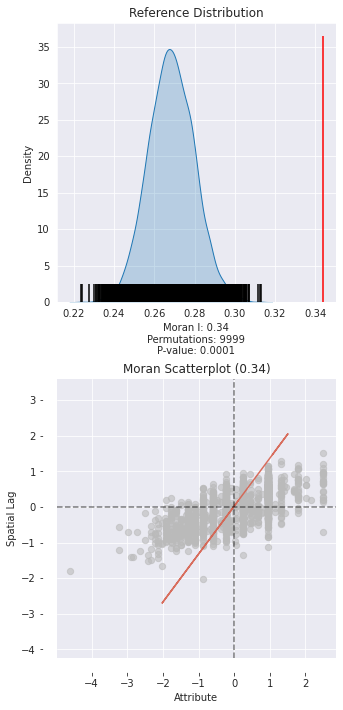

p-value threshold:  0.05
lisa_labels
HH                   79
HL                   59
LH                   28
LL                   78
Not significant    1345
dtype: int64


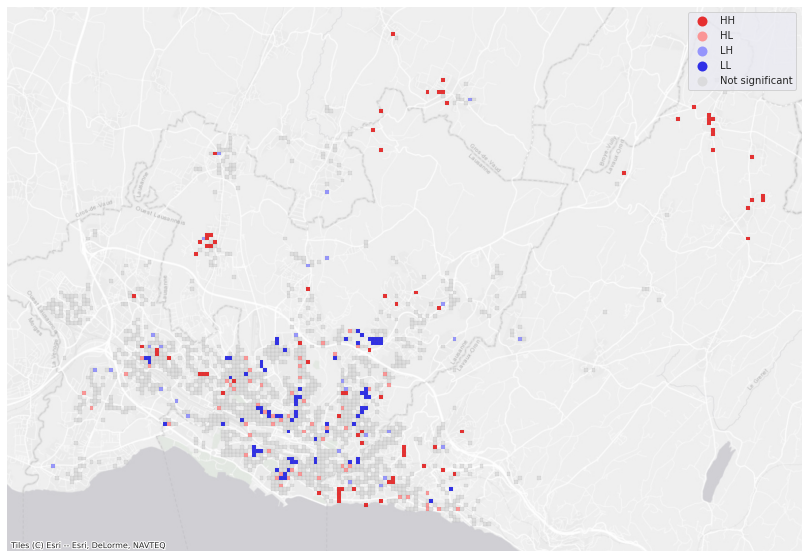

In [198]:
covid_w4 = covid[~covid.logincid_w4.isna()].reset_index(drop=True)
w8k_covid_w4 = esda.compute_distance_weights(covid_w4, 'Kernel', ids='reli', kernel_args=dict(function='quartic', k=8, fixed=False, eps=1.1))
explore_spatial_autocorr(covid_w4, 'logincid_w4', w8k_covid_w4, local_args=dict(alpha=0.05, fdr_adj=False))

/home/aladoy/anaconda3/envs/syndemic/lib/python3.10/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


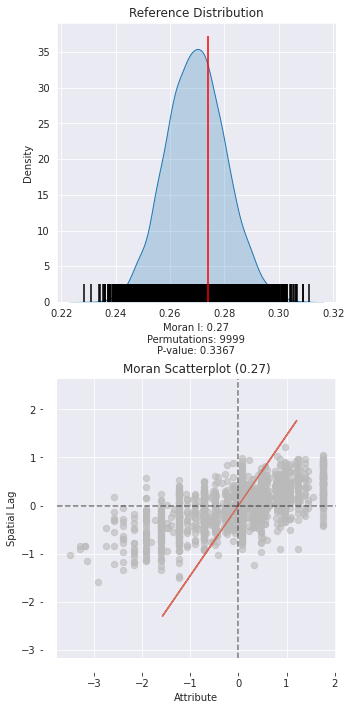

p-value threshold:  0.05
lisa_labels
HH                   54
HL                   47
LH                   34
LL                   44
Not significant    1492
dtype: int64


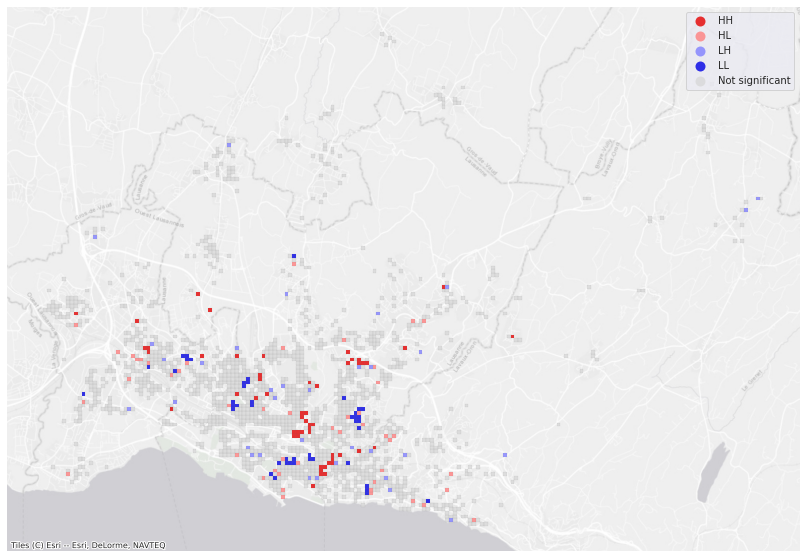

In [199]:
covid_w5 = covid[~covid.logincid_w5.isna()].reset_index(drop=True)
w8k_covid_w5 = esda.compute_distance_weights(covid_w5, 'Kernel', ids='reli', kernel_args=dict(function='quartic', k=8, fixed=False, eps=1.1))
explore_spatial_autocorr(covid_w5, 'logincid_w5', w8k_covid_w5, local_args=dict(alpha=0.05, fdr_adj=False))

In [237]:
def compare_outcomes(colaus_gdf, colaus_var, colaus_w, covid_gdf, covid_var, covid_w):
    LMo_colaus = explore_spatial_autocorr(colaus_gdf, colaus_var, colaus_w, local_args=dict(alpha=0.05, fdr_adj=False))
    LMo_covid = explore_spatial_autocorr(covid_gdf, covid_var, covid_w, local_args=dict(alpha=0.05, fdr_adj=False))
    comp = LMo_colaus[['reli', colaus_var ,'lisa_labels', 'geometry']].merge(LMo_covid[['reli',covid_var,'lisa_labels']], on='reli', suffixes=('_colaus', '_covid'))
    comp[(comp.lisa_labels_colaus==comp.lisa_labels_covid) & (comp.lisa_labels_colaus != 'Not significant')].to_file('../processed_data/'+colaus_var+'_'+covid_var+'.gpkg', driver='GPKG')


In [ ]:
compare_outcomes(colaus, 'cvd_all_logit', w8k_colaus, covid, 'logincid_w1', w8k_covid)

In [ ]:
compare_outcomes(colaus, 'cvd_all_logit', w8k_colaus, covid, 'logincid_w2', w8k_covid)

In [ ]:
compare_outcomes(colaus, 'cvd_all_logit', w8k_colaus,covid_w3, 'logincid_w3', w8k_covid_w3)

In [ ]:
compare_outcomes(colaus, 'cvd_all_logit', w8k_colaus,covid_w4, 'logincid_w4', w8k_covid_w4)

In [ ]:
compare_outcomes(colaus, 'cvd_all_logit', w8k_colaus,covid_w5, 'logincid_w5', w8k_covid_w5)

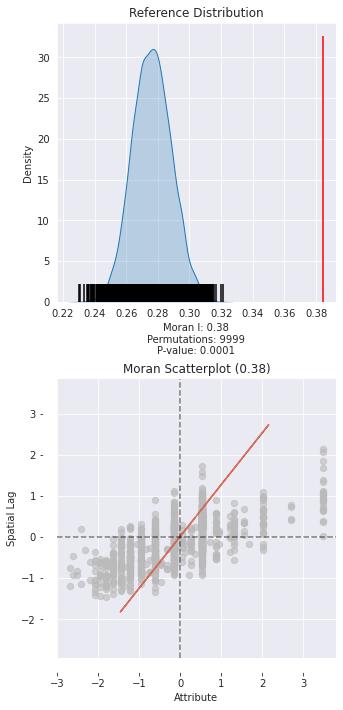

p-value threshold:  0.05
lisa_labels
HH                   69
HL                   45
LH                   24
LL                  125
Not significant    1090
dtype: int64


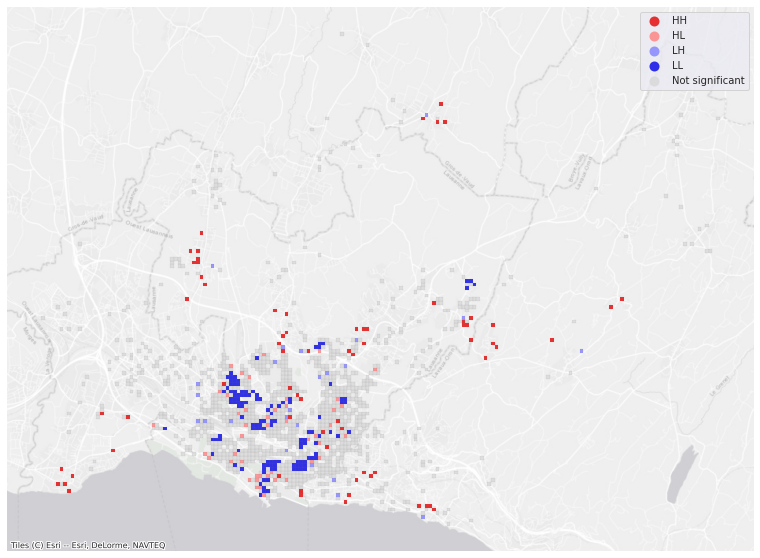

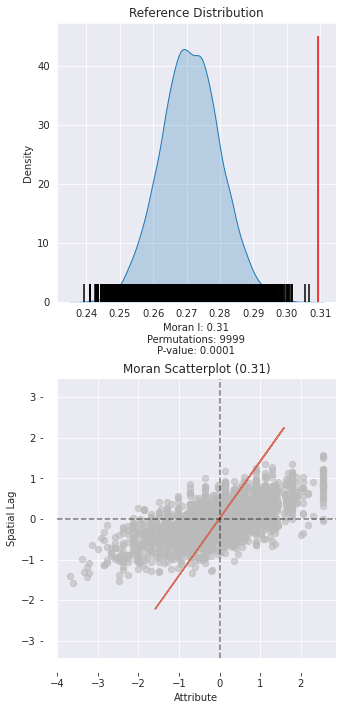

p-value threshold:  0.05
lisa_labels
HH                   98
HL                   74
LH                   63
LL                  102
Not significant    2193
dtype: int64


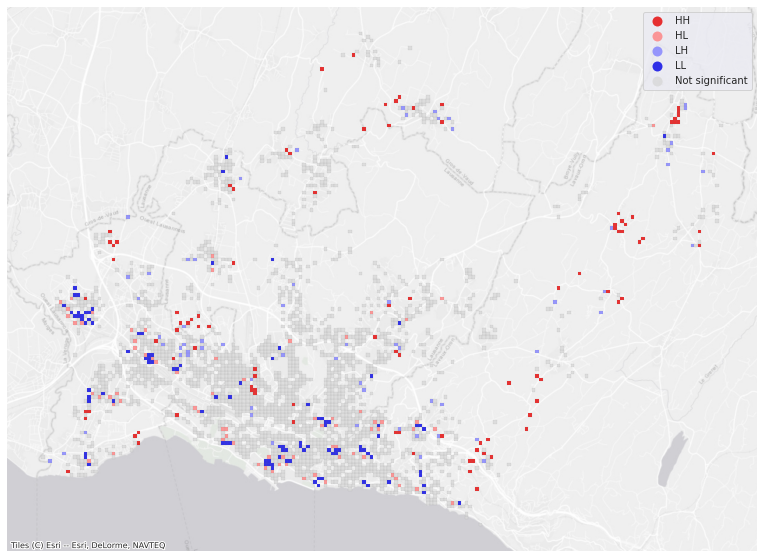

In [265]:
compare_outcomes(colaus, 'cvd_all_logit', w8k_colaus,covid, 'logincid', w8k_covid)

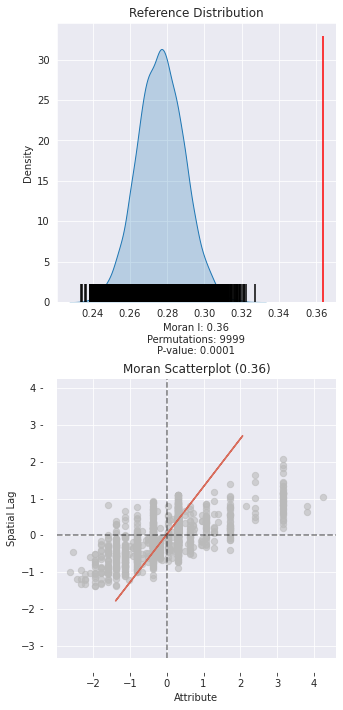

p-value threshold:  0.05
lisa_labels
HH                   84
HL                   51
LH                   30
LL                  108
Not significant    1080
dtype: int64


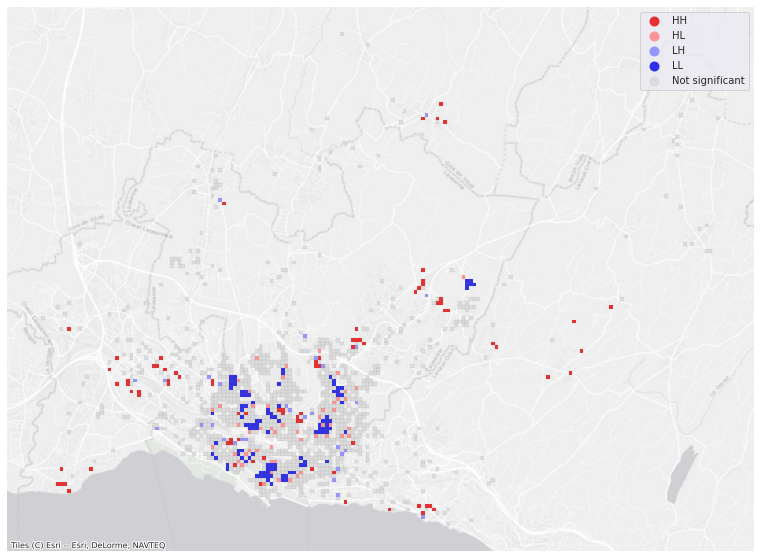

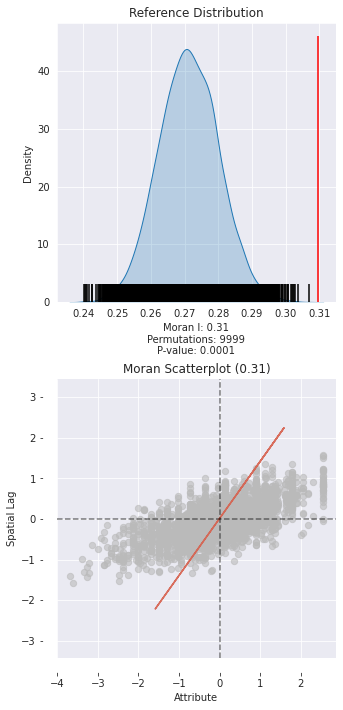

p-value threshold:  0.05
lisa_labels
HH                   98
HL                   74
LH                   63
LL                  102
Not significant    2193
dtype: int64


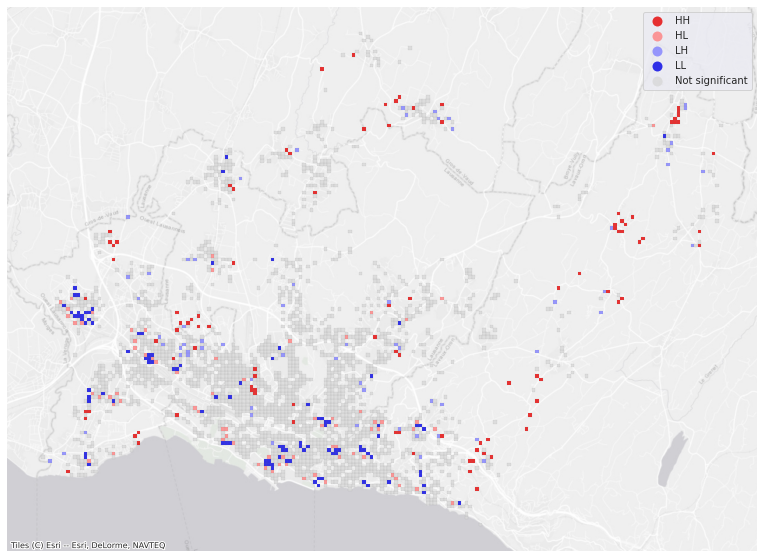

In [264]:
compare_outcomes(colaus, 'diab_m_logit', w8k_colaus, covid, 'logincid', w8k_covid)

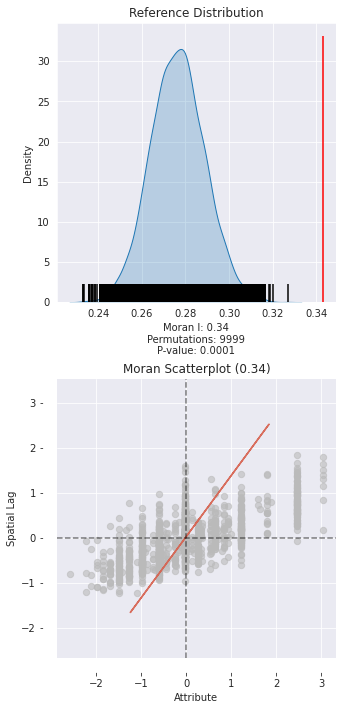

p-value threshold:  0.05
lisa_labels
HH                   26
HL                   33
LH                   60
LL                   88
Not significant    1146
dtype: int64


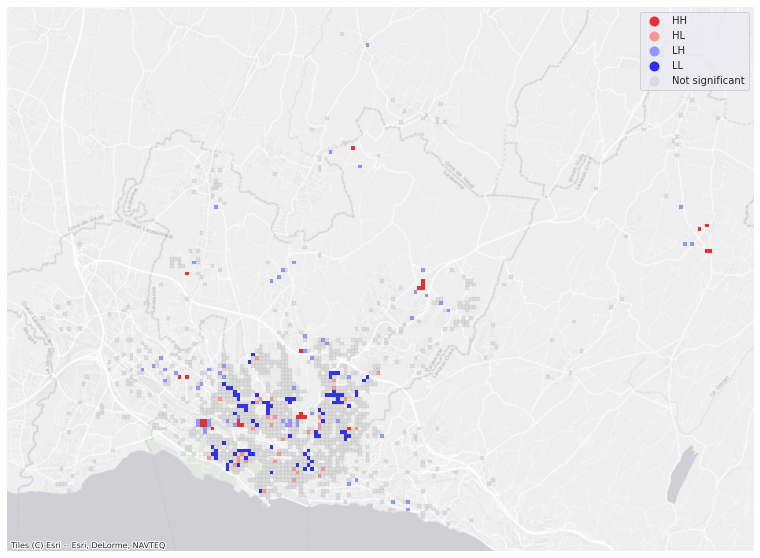

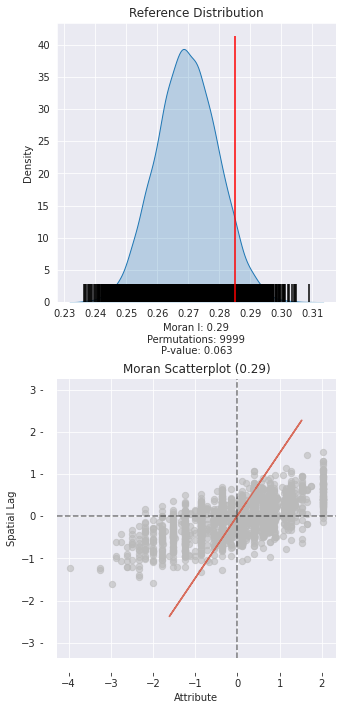

p-value threshold:  0.05
lisa_labels
HH                   58
HL                   60
LH                   38
LL                   61
Not significant    1862
dtype: int64


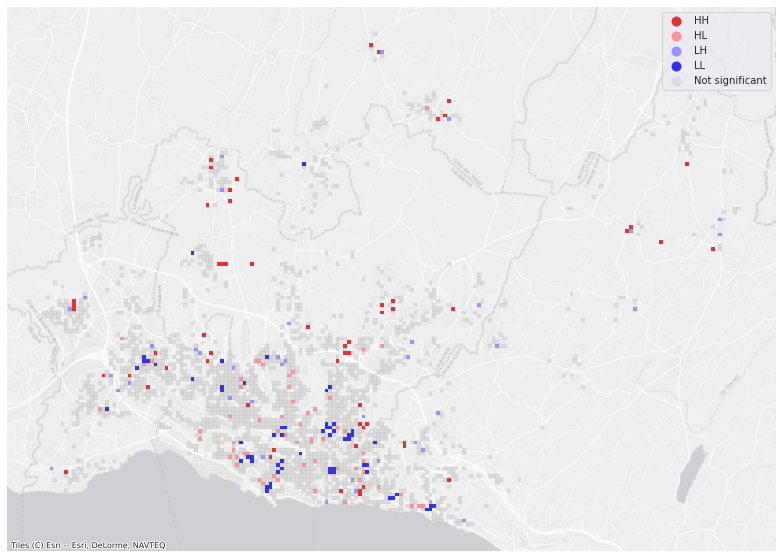

In [246]:
compare_outcomes(colaus, 'obesity_logit', w8k_colaus, covid, 'logincid', w8k_covid)

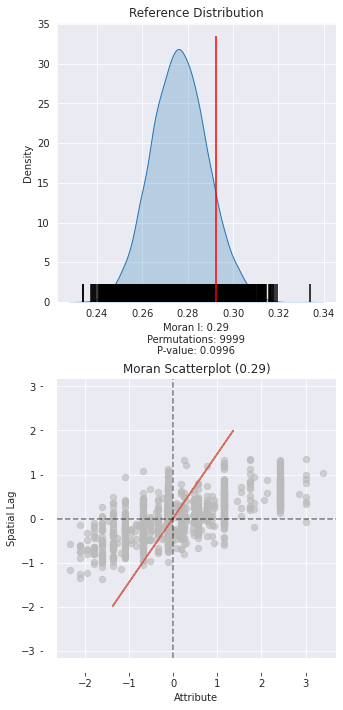

p-value threshold:  0.05
lisa_labels
HH                   24
HL                   29
LH                   50
LL                   62
Not significant    1188
dtype: int64


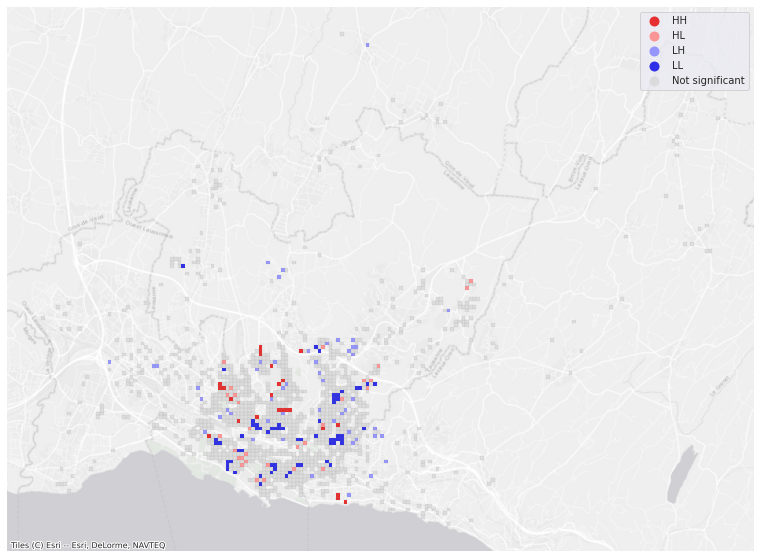

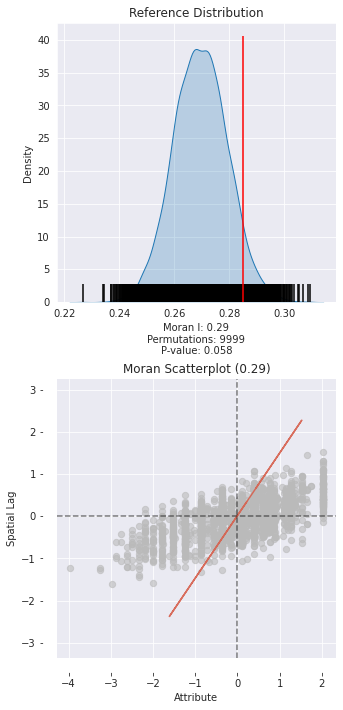

p-value threshold:  0.05
lisa_labels
HH                   58
HL                   60
LH                   38
LL                   61
Not significant    1862
dtype: int64


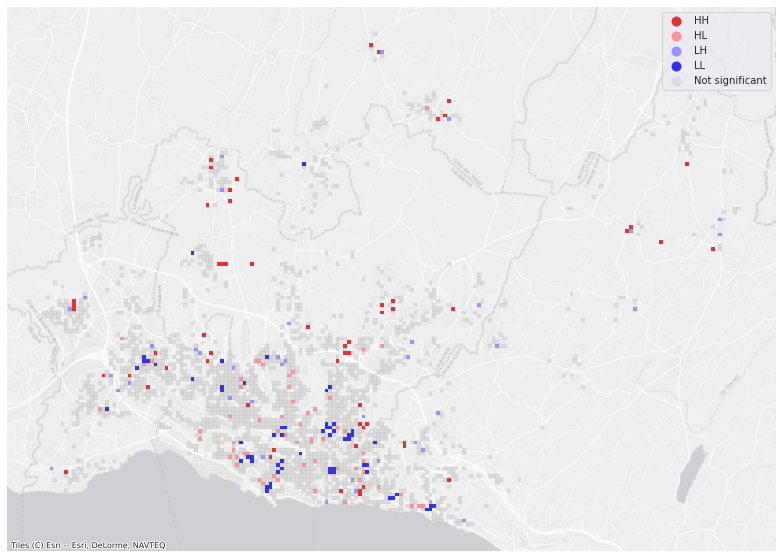

In [247]:
compare_outcomes(colaus, 'polypharm_logit', w8k_colaus, covid, 'logincid', w8k_covid)

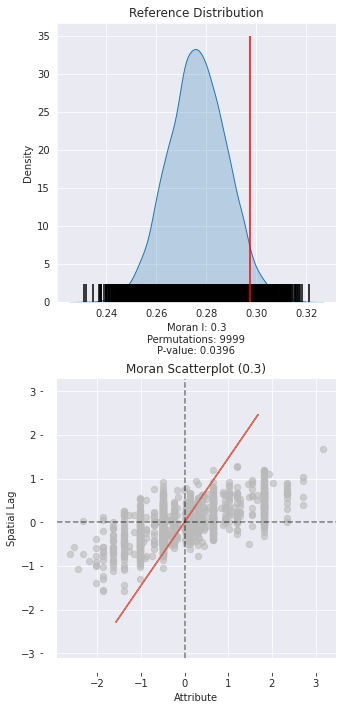

p-value threshold:  0.05
lisa_labels
HH                   27
HL                   25
LH                   42
LL                   54
Not significant    1205
dtype: int64


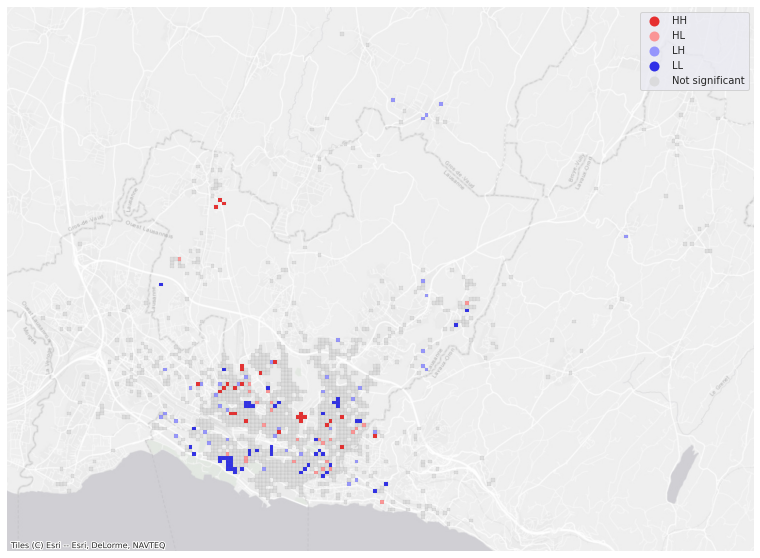

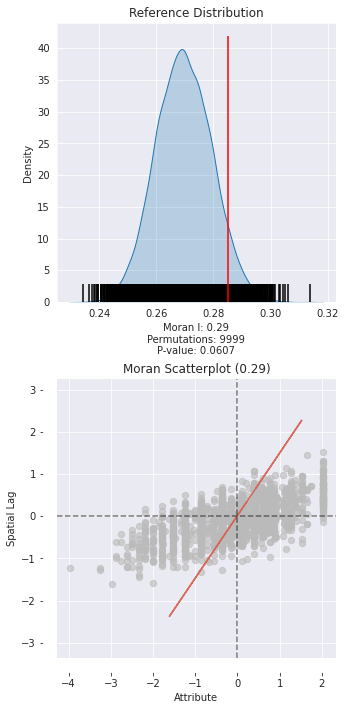

p-value threshold:  0.05
lisa_labels
HH                   58
HL                   60
LH                   38
LL                   61
Not significant    1862
dtype: int64


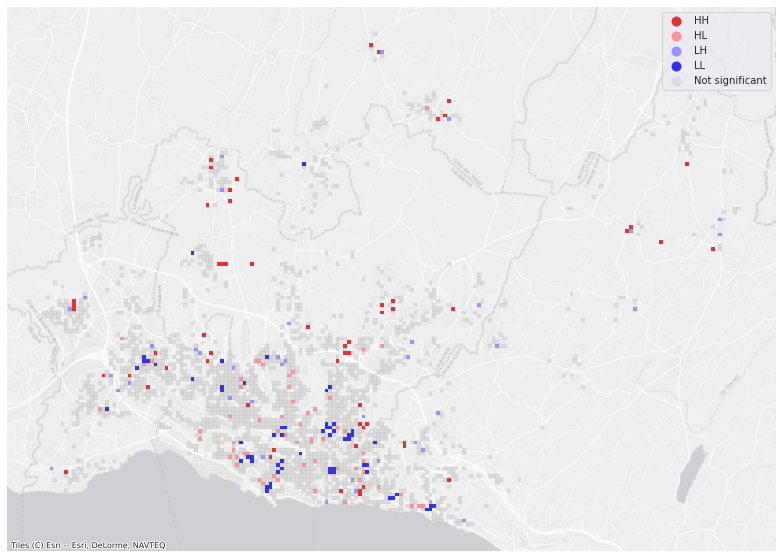

In [248]:
compare_outcomes(colaus, 'ht_t_logit', w8k_colaus, covid, 'logincid', w8k_covid)